In [1]:
import os
import cv2
from math import *
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import glob
import numpy as np
import pickle
%matplotlib inline

In [2]:
def calibrate_camera(img,nx,ny):
    objpoints=[]
    imgpoints=[]
    
    objp=np.zeros((nx*ny,3),np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)
    fname = img[0]
    for fname in img:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    
    return mtx, dist


In [3]:
image=glob.glob('camera_cal/calibration*.jpg')
nx,ny=9,6
mtx,dist=calibrate_camera(image,nx,ny)
print('Done')

Done


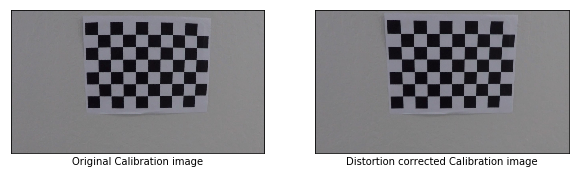

In [4]:
cal_test=glob.glob('camera_cal/calibration*.jpg')
caltest_image= mpimg.imread(cal_test[9])
undist_cal = cv2.undistort(caltest_image, mtx, dist, None, mtx)
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(caltest_image)
plt.xlabel('Original Calibration image')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(1, 2, 2)
plt.imshow(undist_cal)
plt.xlabel('Distortion corrected Calibration image')
plt.xticks([], [])
plt.yticks([], [])
plt.show()

In [5]:
pickle.dump( { 'mtx': mtx, 'dist': dist }, open('./camera_calibration.p', 'wb'))
print('Camera Matrix Saved to Pickle File')

Camera Matrix Saved to Pickle File


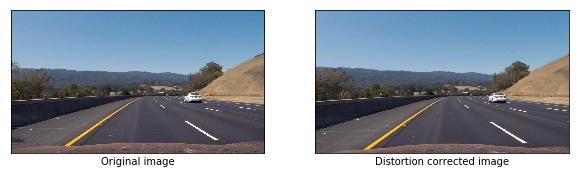

In [6]:
im_test=glob.glob('test_images/test*.jpg')
test_image= mpimg.imread(im_test[2])
undist = cv2.undistort(test_image, mtx, dist, None, mtx)
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(test_image)
plt.xlabel('Original image')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(1, 2, 2)
plt.imshow(undist)
plt.xlabel('Distortion corrected image')
plt.xticks([], [])
plt.yticks([], [])
plt.show()

In [7]:
def perspective_transform(img,src,dst):
    imshape=img.shape
    M=cv2.getPerspectiveTransform(src,dst)
    Minv=cv2.getPerspectiveTransform(dst,src)
    warped=cv2.warpPerspective(img,M,(imshape[1],imshape[0]),flags=cv2.INTER_LINEAR)
    warped_inv=cv2.warpPerspective(img,Minv,(imshape[1],imshape[0]),flags=cv2.INTER_LINEAR)
    return warped,warped_inv
    

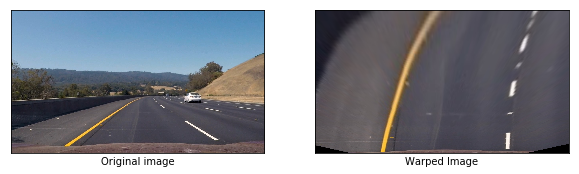

In [8]:
src = np.float32([[585, 450], [203, 720], [1127, 720], [695, 450]])
dst = np.float32([[320, 0], [320, 720], [960,720], [960, 0]])
warped,warped_inv=perspective_transform(undist,src,dst)
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(test_image)
plt.xlabel('Original image')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(1, 2, 2)
plt.imshow(warped)
plt.xlabel('Warped Image')
plt.xticks([], [])
plt.yticks([], [])
plt.show()

In [9]:
def thresholding(img):
    lower_white=np.array([100,100,200],dtype="uint8")
    upper_white=np.array([255,255,255],dtype="uint8")
    lower_yellow=np.array([0,100,100],dtype="uint8")
    upper_yellow=np.array([40,255,255],dtype="uint8")
    hls=cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    mask_white=cv2.inRange(img,lower_white,upper_white)
    mask_yellow=cv2.inRange(hls,lower_yellow,upper_yellow)
    combined_mask=cv2.bitwise_or(mask_white,mask_yellow)
    return combined_mask

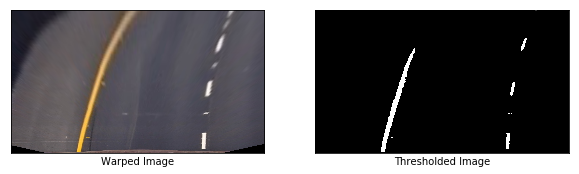

In [10]:
th_mask=thresholding(warped)
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(warped)
plt.xlabel('Warped Image')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(1, 2, 2)
plt.imshow(th_mask,cmap='gray')
plt.xlabel('Thresholded Image')
plt.xticks([], [])
plt.yticks([], [])
plt.show()

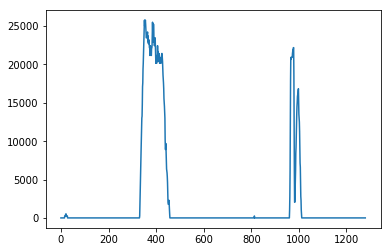

In [11]:
histogram = np.sum(th_mask[int(th_mask.shape[0]/2):,:], axis=0)
plt.plot(histogram)

In [12]:
def hist_window(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
    if len(leftx) == 0:
        left_fit =[]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
    
    if len(rightx) == 0:
        right_fit =[]
    else:
        right_fit = np.polyfit(righty, rightx, 2)
    

    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]


    return left_fit, right_fit,out_img

    

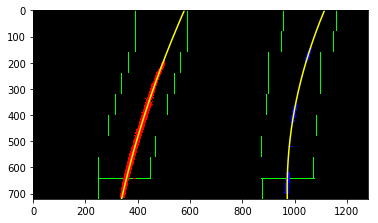

In [13]:
left_fit,right_fit,out_img=hist_window(th_mask)
ploty = np.linspace(0, th_mask.shape[0]-1, th_mask.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.imshow(out_img)


In [14]:
def drawLine(undist, warped,left_fit, right_fit):

    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2+left_fit[1]*ploty+left_fit[2]
    right_fitx = right_fit[0]*ploty**2+right_fit[1]*ploty+right_fit[2] 
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    warp_clr= cv2.warpPerspective(color_warp, Minv, (color_warp.shape[1], color_warp.shape[0])) 
    result = cv2.addWeighted(undist, 1, warp_clr, 0.3, 0)

    return (result,color_warp)

def curvature(left_fit, right_fit, binary_warped):
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    y_eval = np.max(ploty)
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension


    # Fit new polynomials to x,y in world space
    #leftx = left_fit[0]*ploty**2+left_fit[1]*ploty+left_fit[2]
    #rightx = right_fit[0]*ploty**2+right_fit[1]*ploty+left_fit[2]
        
    #left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    center = (((left_fit[0]*720**2+left_fit[1]*720+left_fit[2]) +(right_fit[0]*720**2+right_fit[1]*720+right_fit[2]) ) /2 - 640)*xm_per_pix
    
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    return left_curverad, right_curverad, center
    

In [15]:
images=[]
final_set=[]
left_radius=[]
right_radius=[]
c_offset=[]
for i in range(6):
    sample=mpimg.imread(im_test[i])
    images.append(sample)
    undist=cv2.undistort(images[i], mtx, dist, None, mtx)
    src = np.float32([[585, 450], [203, 720], [1127, 720], [695, 450]])
    dst = np.float32([[320, 0], [320, 720], [960,720], [960, 0]])
    warped_new,warped_inv=perspective_transform(undist,src,dst)
    Minv=cv2.getPerspectiveTransform(dst,src)
    thresh_mask=thresholding(warped_new)
    left_fit,right_fit,_=hist_window(thresh_mask)
    lane_marking,_=drawLine(undist,thresh_mask,left_fit,right_fit)
    left_curv,right_curv,center_offset=curvature(left_fit,right_fit,thresh_mask)
    left_radius.append(left_curv)
    right_radius.append(right_curv)
    c_offset.append(center_offset)
    final_set.append(lane_marking)
    



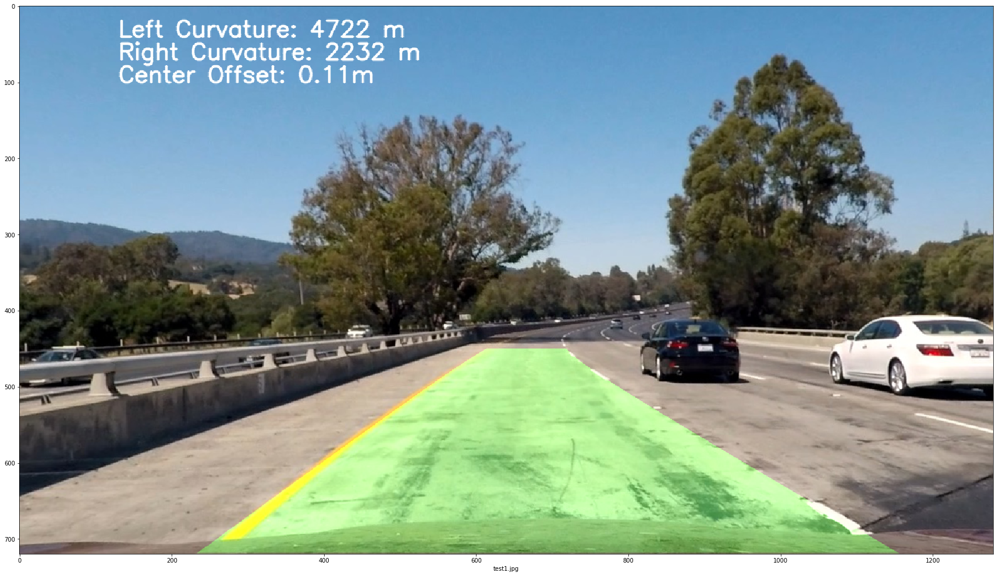

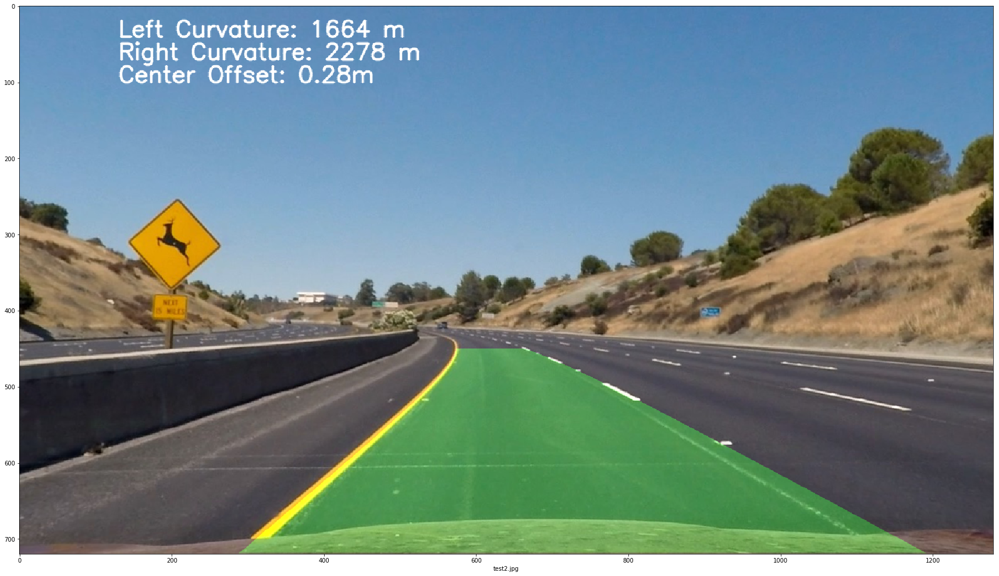

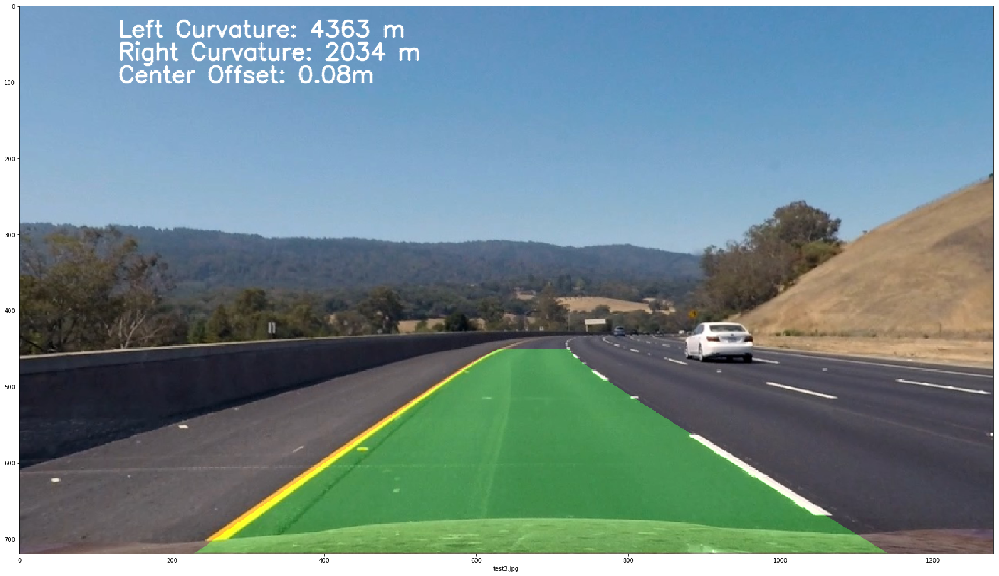

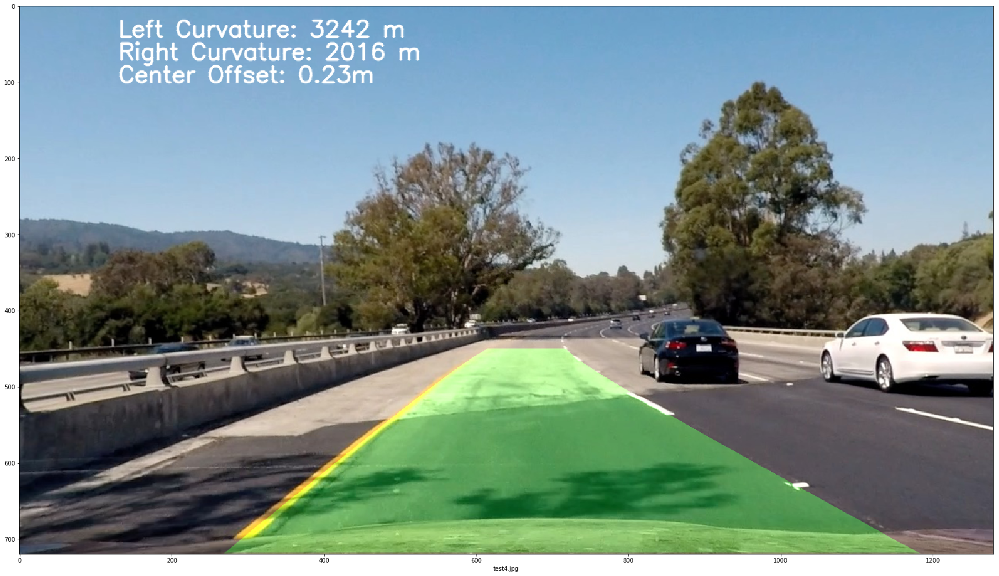

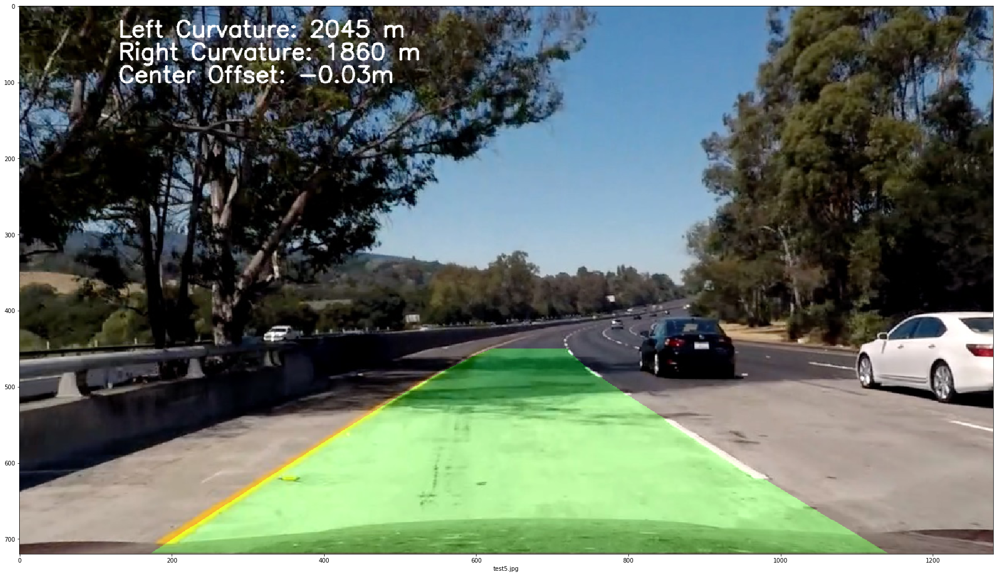

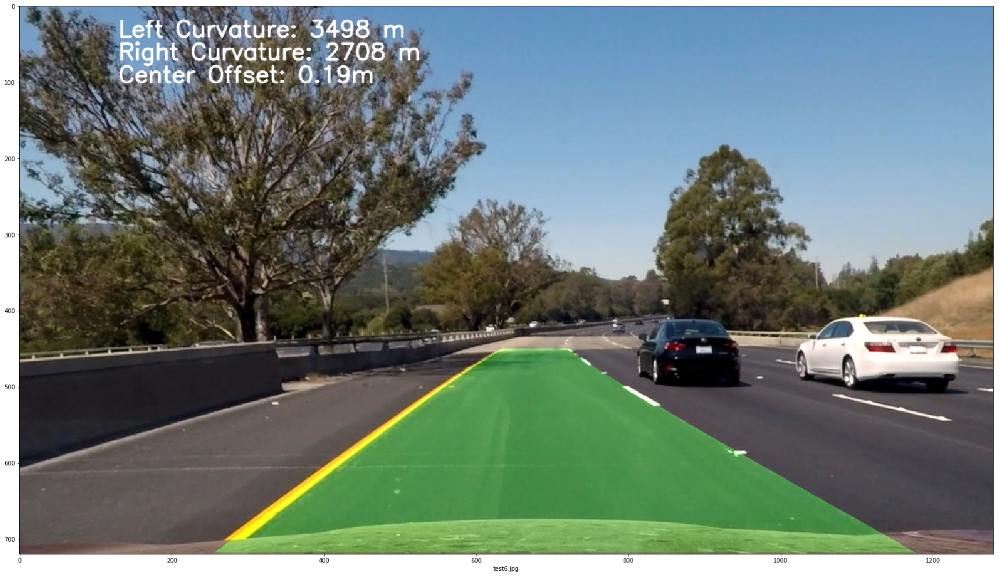

In [17]:
names=os.listdir("test_images/")
for i in range(6):
    plt.figure(figsize=(30,20))
    plt.imshow(final_set[i])
    plt.xlabel(names[i+2])
    left_text = "Left Curvature: " + str(int(left_radius[i])) + " m"
    right_text = "Right Curvature: " + str(int(right_radius[i]))+ " m"
    center_text = "Center Offset: " + str(round( c_offset[i],2)) + "m"
    fontScale=1
    thickness=2
    
    fontFace = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(final_set[i], left_text, (130,40), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(final_set[i], right_text, (130,70), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(final_set[i], center_text, (130,100), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    
    plt.show()

In [ ]:
def thresholding(img):
    lower_white=np.array([100,100,200],dtype="uint8")
    upper_white=np.array([255,255,255],dtype="uint8")
    lower_yellow=np.array([0,100,100],dtype="uint8")
    upper_yellow=np.array([40,255,255],dtype="uint8")
    hls=cv2.cvtColor(img,cv2.COLOR_BGR2HLS)
    mask_white=cv2.inRange(img,lower_white,upper_white)
    mask_yellow=cv2.inRange(hls,lower_yellow,upper_yellow)
    combined_mask=cv2.bitwise_or(mask_white,mask_yellow)
    return combined_mask
cap=cv2.VideoCapture('project_video.mp4')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('Project_video_output.avi',fourcc, 20.0, (1280,720))
while (True):
    ret,frame=cap.read()
    if ret==True:
        undist=cv2.undistort(frame, mtx, dist, None, mtx)
        src = np.float32([[585, 450], [203, 720], [1127, 720], [695, 450]])
        dst = np.float32([[320, 0], [320, 720], [960,720], [960, 0]])

        warped_new,warped_inv=perspective_transform(undist,src,dst)
        Minv=cv2.getPerspectiveTransform(dst,src)
        thresh_mask=thresholding(warped_new)
        left_fit,right_fit,_=hist_window(thresh_mask)
        lane_marking,_=drawLine(undist,thresh_mask,left_fit,right_fit)
        left_curv,right_curv,center_offset=curvature(left_fit,right_fit,thresh_mask)
        #left_radius.append(left_curv)
        #right_radius.append(right_curv)
        #c_offset.append(center_offset)
        left_text = "Left Curvature: " + str(int(left_curv)) + " m"
        right_text = "Right Curvature: " + str(int(right_curv))+ " m"
        center_text = "Center Offset: " + str(round( center_offset,2)) + "m"
        fontScale=1
        thickness=2

        fontFace = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(lane_marking, left_text, (130,40), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
        cv2.putText(lane_marking, right_text, (130,70), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
        cv2.putText(lane_marking, center_text, (130,100), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
        
        out.write(lane_marking)
        #final_set.append(lane_marking)
        #cv2.imshow('undist',undist)
        #cv2.imshow('frame',lane_marking)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break

# When everything done, release the capture
cap.release()
out.release()
cv2.destroyAllWindows()